# Tutorial 3: K-Means and Time Domain Reduction

A good tool to reduce computation time of GenX is to use <a href="https://genxproject.github.io/GenX/dev/methods/#Time-Domain-Reduction-(TDR)" target="_blank">Time Domain Reduction (TDR)</a>. Time Domain Reduction is a method that selects a smaller set of time steps from the data in a way that reduces computation time while still capturing the main information of the model. In this tutorial, we go over how TDR works in GenX and how it uses K-means clustering to choose the optimal time steps. For more information on TDR in capacity expansion models, see <a href="https://www.sciencedirect.com/science/article/pii/S0360544218315238" target="_blank">Mallapragada et al</a>.

### Table of Contents
* [Time Domain Reduction](#TDR)
* [K-Means Clustering](#Kmeans)
* [Results of Time Domain Reduction](#TDRResults)
    * [Reconstruction](#Reconstruction)
* [Extreme Periods](#ExtPeriods)
* [Objective Values and Representative Periods](#ObjVals)

### Time Domain Reduction <a id="TDR"></a>

To see how Time Domain Reduction works, let's look at the `Doad_data` in `example_systems/1_three_zones`:

In [2]:
# First, load all packages needed
using DataFrames
using CSV
using VegaLite
using YAML
using PlotlyJS
using Plots
using Clustering
using ScikitLearn
@sk_import datasets: (make_blobs)

WebIO._IJuliaInit()

[ Info: mkl not found, proceeding to installing non-mkl versions of sci-kit learn via Conda
[ Info: Running `conda install -y -c conda-forge 'scikit-learn>=1.2,<1.3'` in root environment


Solving environment: ...working... done

# All requested packages already installed.





==> WARNING: A newer version of conda exists. <==
  current version: 23.3.1
  latest version: 24.1.2

Please update conda by running

    $ conda update -n base -c conda-forge conda

Or to minimize the number of packages updated during conda update use

     conda install conda=24.1.2




PyObject <function make_blobs at 0x2995396c0>

In [3]:
case = joinpath("example_systems/1_three_zones");

In [4]:
loads =  CSV.read(joinpath(case,"system/Demand_data.csv"),DataFrame,missingstring="NA")

Row,Voll,Demand_Segment,Cost_of_Demand_Curtailment_per_MW,Max_Demand_Curtailment,$/MWh,Rep_Periods,Timesteps_per_Rep_Period,Sub_Weights,Time_Index,Demand_MW_z1,Demand_MW_z2,Demand_MW_z3
,String7,String3,String7,String7,String7,String3,String7,String7,Int64,Int64,Int64,Int64
1,50000,1,1,1,2000,1,8760,8760,1,7850,2242,1070
2,,2,0.9,0.04,1800,,,,2,7424,2120,1012
3,,3,0.55,0.024,1100,,,,3,7107,2029,969
4,,4,0.2,0.003,400,,,,4,6947,1984,947
5,,,,,,,,,5,6922,1977,944
6,,,,,,,,,6,7045,2012,960
7,,,,,,,,,7,7307,2087,996
8,,,,,,,,,8,7544,2154,1029
9,,,,,,,,,9,7946,2269,1083


The columns to note in this file are `Rep_Periods`, `TimeSteps_Per_Rep_Period`, `Time_Index`, and `Demand_MW_`. This file shows the number of time steps used in GenX before applying TDR, i.e. every hour in a year, totaling 8,760 hours. This means that there is only one representative period, as seen in `Rep_Periods`.

TDR performs a "reduction" into a specified number of "representative periods", paring down the input data into a smaller set. The representative periods are then used in the GenX algorithm in place of the entire input data to reduce computation time. The TDR algorithm selects the representative periods to be the set of data whose results in GenX best match the results of the entire input data. To do this, TDR using k-means clustering, described in the next section.

When TDR is used, the file `time_domain_reduction_settings.yml` is called with a variety of specified settings, shown below:

In [5]:
time_domain_reduction_settings = YAML.load(open(joinpath(case,"settings/time_domain_reduction_settings.yml")))

Dict{Any, Any} with 15 entries:
  "IterativelyAddPeriods" => 1
  "ExtremePeriods"        => 1
  "UseExtremePeriods"     => 1
  "MinPeriods"            => 8
  "MaxPeriods"            => 8
  "DemandWeight"          => 1
  "ClusterFuelPrices"     => 1
  "nReps"                 => 100
  "MultiStageConcatenate" => 0
  "Threshold"             => 0.05
  "TimestepsPerRepPeriod" => 168
  "IterateMethod"         => "cluster"
  "ScalingMethod"         => "S"
  "ClusterMethod"         => "kmeans"
  "WeightTotal"           => 8760

Important here to note are `MinPeriods` and `MaxPeriods`. As TDR is performed, it is required to keep the number of representative periods to be between the min and max specified in the settings. This is to ensure that computation time is actually decreased and that the k-means algorithm doesn't just form one large cluster of all points. Additionally, `TimestepsPerRepPeriod` is set to 168, the number of hours in a week (`WeightTotal` includes all 8,760 timesteps, the number of hours in a year.) By specifying the number of timesteps in each representative period to be a week, we form 52 clusters from which the algorithm will choose 8-11.

For descriptions of all settings, see <a href="https://genxproject.github.io/GenX/dev/methods/#GenX.cluster_inputs" target="_blank">GenX.cluster_inputs</a> in the documentation.

Now back to pre-TDR. Below shows the load per timestep in megawatts for the entire dataset, i.e. with only one representative period of 8760 hours. This is done for Zone 1:

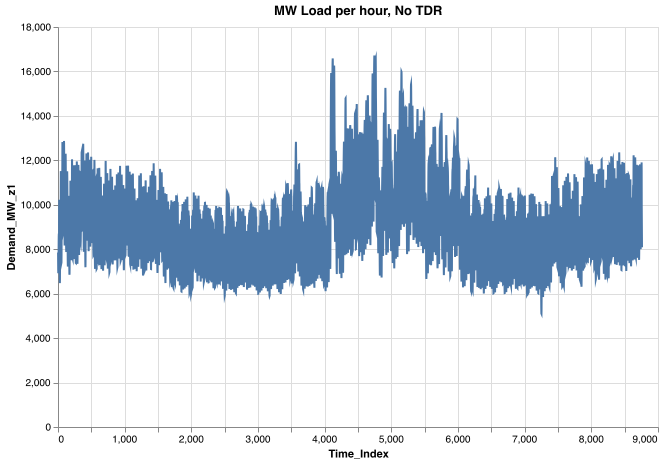

In [5]:
loads |>
@vlplot(:line, 
    x=:Time_Index, y=:Demand_MW_z1, title="MW Load per hour, No TDR",
    width=600,height=400,linewidth=.01)

As in Tutorial 1, we can open the `genx_settings.yml` file for `1_three_zones` to see how `TimeDomainReduction` is set. If it's set to 1, this means TDR is being used.

In [6]:
genx_settings_TZ = YAML.load(open((joinpath(case,"settings/genx_settings.yml"))))

Dict{Any, Any} with 13 entries:
  "NetworkExpansion"       => 1
  "ParameterScale"         => 1
  "EnergyShareRequirement" => 0
  "TimeDomainReduction"    => 0
  "Trans_Loss_Segments"    => 1
  "CapacityReserveMargin"  => 0
  "StorageLosses"          => 1
  "ComputeConflicts"       => 1
  "UCommit"                => 2
  "MaxCapReq"              => 0
  "MinCapReq"              => 0
  "CO2Cap"                 => 2
  "WriteShadowPrices"      => 1

To visualize how TDR decreases computation time, let's start by running `SmallNewEngland/OneZone` without TDR. In the third section of this tutorial, we'll run the example again using TDR.

To run GenX without TDR, we start by editing the settings to set `TimeDomainReduction` to 0:

In [11]:
genx_settings_TZ["TimeDomainReduction"] = 0
genx_settings_TZ ## Output settings

Dict{Any, Any} with 13 entries:
  "NetworkExpansion"       => 1
  "ParameterScale"         => 1
  "EnergyShareRequirement" => 0
  "TimeDomainReduction"    => 0
  "Trans_Loss_Segments"    => 1
  "CapacityReserveMargin"  => 0
  "StorageLosses"          => 1
  "ComputeConflicts"       => 1
  "UCommit"                => 2
  "MaxCapReq"              => 0
  "MinCapReq"              => 0
  "CO2Cap"                 => 2
  "WriteShadowPrices"      => 1

Then we write the edited settings to the file path:

In [12]:
YAML.write_file((joinpath(case,"settings/genx_settings.yml")), genx_settings_TZ)

And run it using `include`. (Note: this process will take a few minutes):

In [13]:
@time include("example_systems/1_three_zones/Run.jl")

Configuring Settings
Configuring Solver
Loading Inputs
Reading Input CSV Files
Network.csv Successfully Read!
Demand (load) data Successfully Read!
Fuels_data.csv Successfully Read!


[ Info: Thermal.csv Successfully Read.
[ Info: Vre.csv Successfully Read.
[ Info: Storage.csv Successfully Read.



Summary of resources loaded into the model:
-------------------------------------------------------
	Resource type 		Number of resources
	Thermal        		3
	VRE            		4
	Storage        		3
Total number of resources: 10
-------------------------------------------------------
Generators_variability.csv Successfully Read!
Validating time basis
CO2_cap.csv Successfully Read!
CSV Files Successfully Read In From /Users/mayamutic/Desktop/GenX-Tutorials/Tutorials/example_systems/1_three_zones
Generating the Optimization Model
Set parameter Username
Academic license - for non-commercial use only - expires 2024-09-14
Set parameter FeasibilityTol to value 1e-05
Set parameter PreDual to value 0
Set parameter Method to value 4
Set parameter TimeLimit to value 110000
Set parameter MIPGap to value 0.001
Set parameter OptimalityTol to value 1e-05
Set parameter AggFill to value 10
Set parameter Presolve to value 1
Discharge Module
Non-served Energy Module
Investment Discharge Module
Unit Commi

Writing Output
Time elapsed for writing costs is
1.462682375
Time elapsed for writing capacity is
0.383794917
Time elapsed for writing power is
0.79280225
Time elapsed for writing charge is
0.361022875
Time elapsed for writing capacity factor is
0.311599166
Time elapsed for writing storage is
0.201464958
Time elapsed for writing curtailment is
0.266842875
Time elapsed for writing nse is
0.820727541
Time elapsed for writing power balance is
0.535388916
Time elapsed for writing transmission flows is
0.228171792
Time elapsed for writing transmission losses is
0.111578083
Time elapsed for writing network expansion is
0.098874708
Time elapsed for writing emissions is
0.4005975
Time elapsed for writing reliability is
0.1648525
Time elapsed for writing storage duals is
0.42862
Time elapsed for writing commitment is
0.106591625
Time elapsed for writing startup is
0.151313333
Time elapsed for writing shutdown is
0.070099125
Time elapsed for writing fuel consumption is
0.518047875
Time elapsed f

This took a little while to run, and would take even longer for larger systems. Let's see how we can get the run time down using Time Domain Reduction. The next sections go over how K-means clustering is used to perform TDR, and how to interpret the resulting files in GenX.

### K-means clustering <a id="Kmeans"></a>

Let's go over how TDR works. To perform TDR, GenX uses __K-means clustering__. K-means is an optimization method that clusters data into several groups based on their proximity to "centers" determined by the algorithm. 

K-means finds a set number of groups such that the variance between the distance of each point in the group to the mean of the group is minimized. 

$$
\begin{align*}
\mathop{\arg \min}\limits_{\mathbf{S}} & \sum_{i = 1}^k \sum_{x \in S_i} ||x - \mu_i||^2 \\
\end{align*}
$$

Where $\mathbf{S} = \{S_1, ... , S_k\}$ are the clusters, with $x$ denoting the elements of the clusters, and $\mu_i$ the mean of each cluster, i.e. the mean of the distances from each point to the center of the cluster. By taking the argmin over $\mathbf{S}$, the points $x$ are clustered into groups where their distance to the center is the smallest. For more information on how k-means works, see the  <a href="https://en.wikipedia.org/wiki/K-means_clustering" target="_blank">Wikipedia</a>. 

GenX uses the package `Clustering.jl`, with documentation <a href="https://juliastats.org/Clustering.jl/dev/kmeans.html#K-means" target="_blank">here</a>. As an example, using the package `ScikitLearn.jl`, let's generate data that can cluster easily.

In [ ]:
centers = 5
X, y = make_blobs(n_samples=50,centers=centers); # From scikit-learn
b = DataFrame(X,:auto)

Note that clustering works for data without obvious groupings, but using blobs as an example makes k-means easier to visualize.

In [ ]:
plotly()
Plots.scatter(b[!,"x1"],b[!,"x2"],legend=false,title="Before K-means Clustering")

Now we use the function `kmeans`, which is also used in `src/time_domain_reduction` in GenX.

In [ ]:
R = kmeans(transpose(Matrix(b)),centers)

`kmeans` returns three outputs: assignments, centers, and counts. Assignments shows to which cluster each points belongs, centers shows where the center coordinates of each cluster are, and counts shows how many points belong to each cluster.

In [ ]:
println("Assignments = ",R.assignments)
println("")
println("Counts = ",R.counts)
println("")
println("Centers:")
R.centers

In [ ]:
plotly()
Plots.scatter(b[!,"x1"],b[!,"x2"],legend=false,marker_z=R.assignments,c=:lightrainbow,title="After K-means Clustering")

In GenX, the representative periods are the centers of the clusters, each representing one week of the year. In the above example that would mean there are 52 data points gathered into 11 clusters (to see this for yourself, change `make_blobs` to have 52 data points and 11 clusters.)

### Results of Time Domain Reduction <a id="TDRResults"></a>

To visualize the results of TDR, we'll set TDR = 1 back in the `genx_settings.yml` file in `Example_Systems_Tutorials/SmallNewEngland/OneZone/`:

In [14]:
genx_settings_TZ["TimeDomainReduction"] = 1;

In [15]:
genx_settings_TZ

Dict{Any, Any} with 13 entries:
  "NetworkExpansion"       => 1
  "ParameterScale"         => 1
  "EnergyShareRequirement" => 0
  "TimeDomainReduction"    => 1
  "Trans_Loss_Segments"    => 1
  "CapacityReserveMargin"  => 0
  "StorageLosses"          => 1
  "ComputeConflicts"       => 1
  "UCommit"                => 2
  "MaxCapReq"              => 0
  "MinCapReq"              => 0
  "CO2Cap"                 => 2
  "WriteShadowPrices"      => 1

In [16]:
YAML.write_file((joinpath(case,"settings/genx_settings.yml")), genx_settings_TZ)

And run GenX again with TDR:

In [13]:
@time include("example_systems/1_three_zones/Run.jl")

Configuring Settings
Time Series Data Already Clustered.
Configuring Solver
Loading Inputs
Reading Input CSV Files
Network.csv Successfully Read!
Demand (load) data Successfully Read!
Fuels_data.csv Successfully Read!

Summary of resources loaded into the model:
-------------------------------------------------------
	Resource type 		Number of resources
	Thermal        		3
	VRE            		4
	Storage        		3
Total number of resources: 10
-------------------------------------------------------
Generators_variability.csv Successfully Read!
Validating time basis
CO2_cap.csv Successfully Read!
CSV Files Successfully Read In From /Users/mayamutic/Desktop/GenX-Tutorials/Tutorials/example_systems/1_three_zones
Generating the Optimization Model
Set parameter Username
Academic license - for non-commercial use only - expires 2024-09-14
Set parameter FeasibilityTol to value 1e-05
Set parameter PreDual to value 0
Set parameter Method to value 4
Set parameter TimeLimit to value 110000
Set param

[ Info: Thermal.csv Successfully Read.
[ Info: Vre.csv Successfully Read.
[ Info: Storage.csv Successfully Read.


Fuel Module
CO2 Module
Transmission Module
Dispatchable Resources Module
Storage Resources Module
Storage Investment Module
Storage Core Resources Module
Storage Resources with Symmetric Charge/Discharge Capacity Module
Thermal (Unit Commitment) Resources Module
CO2 Policies Module
Time elapsed for model building is
0.204282
Solving Model
Set parameter FeasibilityTol to value 1e-05
Set parameter PreDual to value 0
Set parameter Method to value 4
Set parameter TimeLimit to value 110000
Set parameter MIPGap to value 0.001
Set parameter OptimalityTol to value 1e-05
Set parameter AggFill to value 10
Set parameter Presolve to value 1
Gurobi Optimizer version 10.0.3 build v10.0.3rc0 (mac64[arm])

CPU model: Apple M2
Thread count: 8 physical cores, 8 logical processors, using up to 8 threads

Optimize a model with 55787 rows, 43699 columns and 187463 nonzeros
Model fingerprint: 0x61ab5470
Coefficient statistics:
  Matrix range     [3e-06, 1e+01]
  Objective range  [5e-04, 1e+03]
  Bounds rang

Csv files with the results of TDR are generated automatically in a folder called `TDR_results` found within the same folder containing the input csv files, in this case `Example_Systems_Tutorials/SmallNewEngland/OneZone`. The csv files in this folder show the files used in `Run.jl` that have been pared down from the initial input files.

As an example, consider the input file `Fuels_data.csv`:

In [14]:
Fuels_original = CSV.read(joinpath(case,"system/Fuels_data.csv"),DataFrame,missingstring="NA")

Row,Time_Index,CT_NG,ME_NG,MA_NG,None
,Int64,Float64,Float64,Float64,Int64
1,0,0.05306,0.05306,0.05306,0
2,1,5.45,5.45,5.28,0
3,2,5.45,5.45,5.28,0
4,3,5.45,5.45,5.28,0
5,4,5.45,5.45,5.28,0
6,5,5.45,5.45,5.28,0
7,6,5.45,5.45,5.28,0
8,7,5.45,5.45,5.28,0
9,8,5.45,5.45,5.28,0


Compared to `TDR_Results/Fuels_data.csv`:

In [15]:
Fuels_TDR = CSV.read(joinpath(case,"TDR_Results/Fuels_data.csv"),DataFrame,missingstring="NA")

Row,Time_Index,CT_NG,ME_NG,MA_NG,None
,Int64,Float64,Float64,Float64,Float64
1,0,0.05306,0.05306,0.05306,0.0
2,1,5.45,5.45,5.28,0.0
3,2,5.45,5.45,5.28,0.0
4,3,5.45,5.45,5.28,0.0
5,4,5.45,5.45,5.28,0.0
6,5,5.45,5.45,5.28,0.0
7,6,5.45,5.45,5.28,0.0
8,7,5.45,5.45,5.28,0.0
9,8,5.45,5.45,5.28,0.0


As you can see, the original has all 8,760 hours, while the TDR version only has 1,848 hours.

In [16]:
loads_TDR = CSV.read(joinpath(case,"TDR_Results/Demand_data.csv"),DataFrame,missingstring="NA")

Row,Voll,Demand_Segment,Cost_of_Demand_Curtailment_per_MW,Max_Demand_Curtailment,$/MWh,Rep_Periods,Timesteps_per_Rep_Period,Sub_Weights,Time_Index,Demand_MW_z1,Demand_MW_z2,Demand_MW_z3
,String7,String3,String7,String7,String7,String3,String3,String31,Int64,Float64,Float64,Float64
1,50000,1,1.0,1.0,2000,4,168,842.3076923076924,1,8726.38,2492.52,1190.24
2,,2,0.9,0.04,1800,,,2021.5384615384617,2,8440.51,2410.83,1151.4
3,,3,0.55,0.024,1100,,,3874.6153846153843,3,8303.06,2370.98,1131.48
4,,4,0.2,0.003,400,,,2021.5384615384617,4,8242.3,2355.04,1123.51
5,,,,,,,,,5,8297.08,2369.98,1131.48
6,,,,,,,,,6,8523.18,2434.74,1161.36
7,,,,,,,,,7,8923.6,2549.3,1217.13
8,,,,,,,,,8,9361.86,2673.83,1276.9
9,,,,,,,,,9,9942.55,2839.2,1355.58


The 1,848 hours are divided into 11 sections of 168 hours, with each section representing one week of the original data.  The number of hours per representative period is set in `time_domain_reduction_settings.yml`. Also specified in the file are the minimum and maximum number of clusters we would like to have (in this case 8 and 11). The k-means algorithm will then select the number of clusters that should be sufficient to capture the GenX model in fewer time steps (in this case 11).

In [17]:


Gen_TDR = CSV.read(joinpath(case,"TDR_Results/Generators_variability.csv"),DataFrame,missingstring="NA")



Row,Time_Index,MA_natural_gas_combined_cycle,CT_natural_gas_combined_cycle,ME_natural_gas_combined_cycle,MA_solar_pv,CT_onshore_wind,CT_solar_pv,ME_onshore_wind,MA_battery,CT_battery,ME_battery
,Int64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64
1,1,1.0,1.0,1.0,0.0,0.654001,0.0,0.651881,1.0,1.0,1.0
2,2,1.0,1.0,1.0,0.0,0.640632,0.0,0.662853,1.0,1.0,1.0
3,3,1.0,1.0,1.0,0.0,0.674217,0.0,0.688196,1.0,1.0,1.0
4,4,1.0,1.0,1.0,0.0,0.591154,0.0,0.53014,1.0,1.0,1.0
5,5,1.0,1.0,1.0,0.0,0.498415,0.0,0.557922,1.0,1.0,1.0
6,6,1.0,1.0,1.0,0.0,0.539108,0.0,0.685596,1.0,1.0,1.0
7,7,1.0,1.0,1.0,0.0,0.597887,0.0,0.675388,1.0,1.0,1.0
8,8,1.0,1.0,1.0,0.0,0.52452,0.0,0.555114,1.0,1.0,1.0
9,9,1.0,1.0,1.0,0.2175,0.714665,0.2258,0.545946,1.0,1.0,1.0


In [18]:
generators = CSV.read(joinpath(case,"system/Generators_variability.csv"),DataFrame,missingstring="NA")

Row,Time_Index,MA_natural_gas_combined_cycle,MA_solar_pv,CT_natural_gas_combined_cycle,CT_onshore_wind,CT_solar_pv,ME_natural_gas_combined_cycle,ME_onshore_wind,MA_battery,CT_battery,ME_battery
,Int64,Int64,Float64,Int64,Float64,Float64,Int64,Float64,Int64,Int64,Int64
1,1,1,0.0,1,0.569945,0.0,1,0.920104,1,1,1
2,2,1,0.0,1,0.623259,0.0,1,0.882234,1,1,1
3,3,1,0.0,1,0.694188,0.0,1,0.895074,1,1,1
4,4,1,0.0,1,0.6474,0.0,1,0.873049,1,1,1
5,5,1,0.0,1,0.381774,0.0,1,0.831012,1,1,1
6,6,1,0.0,1,0.244583,0.0,1,0.776542,1,1,1
7,7,1,0.0,1,0.293397,0.0,1,0.704863,1,1,1
8,8,1,0.0,1,0.378603,0.0,1,0.647961,1,1,1
9,9,1,0.1779,1,0.329338,0.2003,1,0.526325,1,1,1


Below, we create arrays out of the representative weeks and plot them on the same plot used in the beginning of this tutorial. The file `Period_map` shows which periods (weeks) are used in TDR and which time step corresponds to each period:

In [43]:

Period_map = CSV.read(joinpath(case,"TDR_Results/Period_map.csv"),DataFrame,missingstring="NA")

Row,Period_Index,Rep_Period,Rep_Period_Index
,Int64,Int64,Int64
1,1,4,2
2,2,2,1
3,3,4,2
4,4,4,2
5,5,2,1
6,6,6,3
7,7,6,3
8,8,6,3
9,9,12,4


In [20]:
# Find array of unique representative periods
rep_periods = unique(Period_map[!,"Rep_Period"])
# Create an array of the time steps and MW values of each representative period
weeks_load = []
weeks_wind = []
for i in rep_periods
    week_temp_loads = [repeat([i],168) loads[(168*i-167):168*i,"Time_Index"] loads[(168*i-167):168*i,"Demand_MW_z1"]]
    week_temp_wind = [repeat([i],168) generators[(168*i-167):168*i,"Time_Index"] generators[(168*i-167):168*i,"CT_onshore_wind"]]
    weeks_load = [weeks_load; week_temp_loads]
    weeks_wind = [weeks_wind; week_temp_wind]
end

In [21]:
# Combine with Total (pre TDR)
loads_plot = [repeat(["Total"],8760) loads[!,"Time_Index"] loads[!,"Demand_MW_z1"]];
wind_plot = [repeat(["Total"],8760) generators[!,"Time_Index"] generators[!,"CT_onshore_wind"]]

8760×3 Matrix{Any}:
 "Total"     1  0.569945
 "Total"     2  0.623259
 "Total"     3  0.694188
 "Total"     4  0.6474
 "Total"     5  0.381774
 "Total"     6  0.244583
 "Total"     7  0.293397
 "Total"     8  0.378603
 "Total"     9  0.329338
 "Total"    10  1.52e-5
 "Total"    11  4.55e-5
 "Total"    12  0.00057204
 "Total"    13  0.0868018
 ⋮              
 "Total"  8749  0.904116
 "Total"  8750  0.719637
 "Total"  8751  0.299922
 "Total"  8752  0.255119
 "Total"  8753  0.505676
 "Total"  8754  0.899923
 "Total"  8755  0.988318
 "Total"  8756  0.30553
 "Total"  8757  0.445488
 "Total"  8758  0.304045
 "Total"  8759  0.617811
 "Total"  8760  0.652052

In [22]:
# Add column names and convert column type
loads_with_TDR = [loads_plot; weeks_load]
loads_with_TDR = DataFrame(loads_with_TDR ,["Week","hour", "MW"])
loads_with_TDR[!,:hour] = convert.(Int64,loads_with_TDR[!,:hour]);
loads_with_TDR[!,:MW] = convert.(Float64,loads_with_TDR[!,:MW]);

In [23]:
wind_with_TDR = [wind_plot; weeks_wind]
wind_with_TDR = DataFrame(wind_with_TDR ,["Week","hour", "MW"])
wind_with_TDR[!,:hour] = convert.(Int64,wind_with_TDR[!,:hour]);
wind_with_TDR[!,:MW] = convert.(Float64,wind_with_TDR[!,:MW]);
wind_with_TDR

Row,Week,hour,MW
,Any,Int64,Float64
1,Total,1,0.569945
2,Total,2,0.623259
3,Total,3,0.694188
4,Total,4,0.6474
5,Total,5,0.381774
6,Total,6,0.244583
7,Total,7,0.293397
8,Total,8,0.378603
9,Total,9,0.329338


Here's the same plot from before but with representative weeks highlighted:

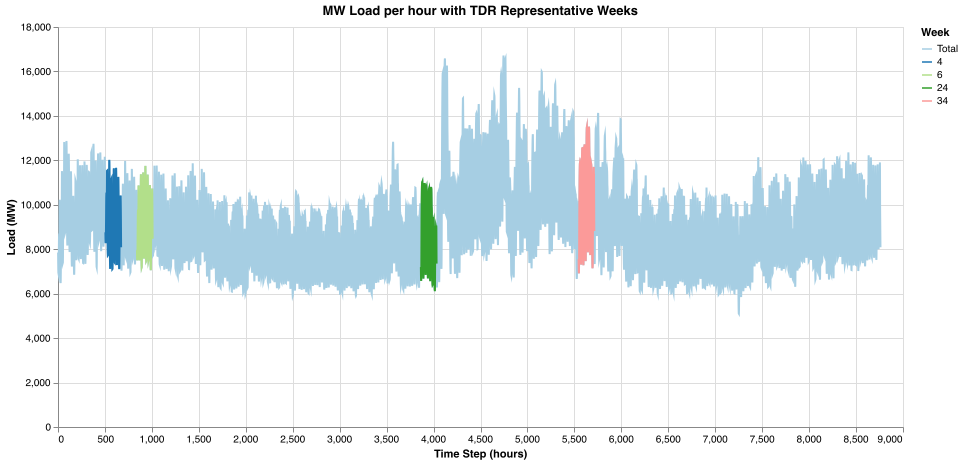

In [24]:
loads_with_TDR  |>
@vlplot(mark={:line},
    x={:hour,title="Time Step (hours)",labels="Week:n"}, y={:MW,title="Load (MW)"},
    color={"Week:n", scale={scheme="paired"},sort="decsending"}, title="MW Load per hour with TDR Representative Weeks",
    width=845,height=400)

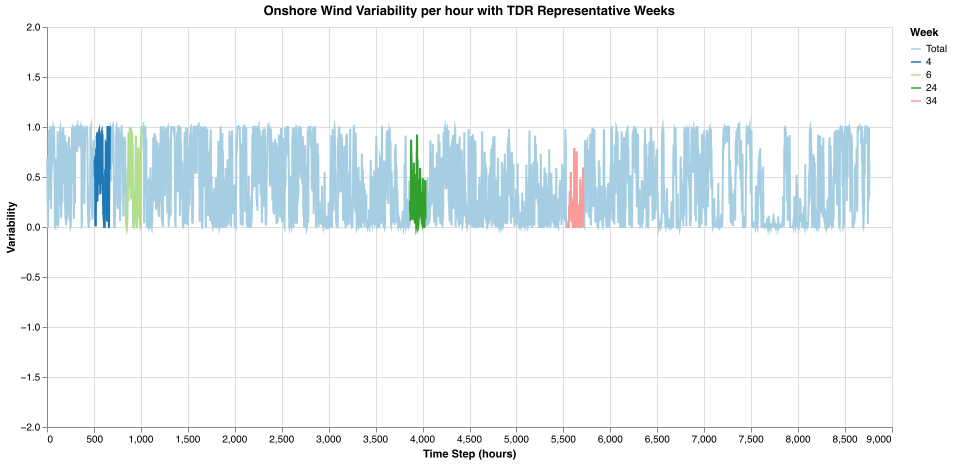

In [25]:
# F: what units?
wind_with_TDR  |>
@vlplot(mark={:line},
    x={:hour,title="Time Step (hours)",labels="Week:n"}, y={:MW,title="Variability",scale={domain=[-2,2]}}, 
    color={"Week:n", scale={scheme="paired"},sort="decsending"},title="Onshore Wind Variability per hour with TDR Representative Weeks",
    width=845,height=400)

In [ ]:
# TO DO: Plot other loads?
# May be better to show wind instead of load -- generators variability
# Plot representative periods -- reconstructed time series

#### Reconstruction <a id="Reconstruction"></a>

Below is a plot of a reconstruction of the data using only the weeks isolated as representative periods. 

In [26]:
recon = []
for i in range(1,52)
    index = Period_map[i,"Rep_Period"]
    recon_temp = [repeat([index],168) collect((168*i-167):168*i) loads[(168*index-167):168*index,"Demand_MW_z1"]]
    recon = [recon; recon_temp]
end

In [27]:
recon = DataFrame(recon,["Week","hour", "MW"])
recon[!,:hour] = convert.(Int64,recon[!,:hour]);
recon[!,:MW] = convert.(Float64,recon[!,:MW]);

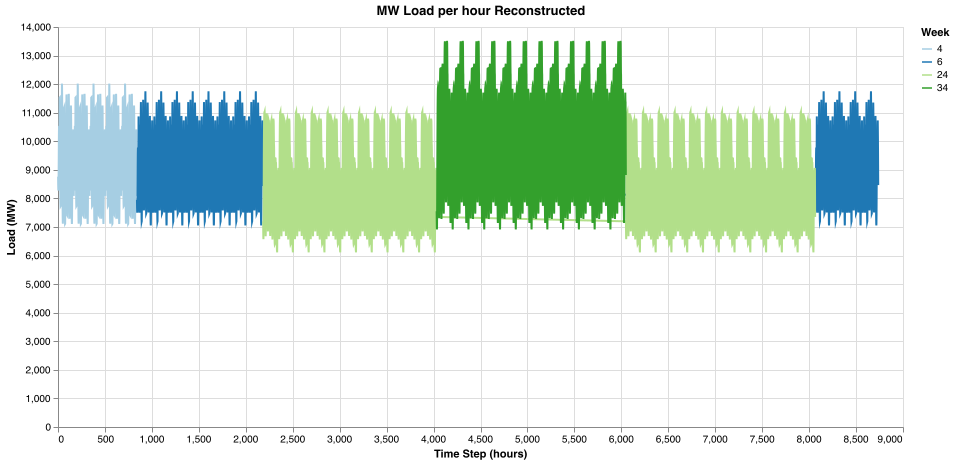

In [28]:
recon  |>
@vlplot(mark={:line},
    x={:hour,title="Time Step (hours)",labels="Week:n"}, y={:MW,title="Load (MW)"},
    color={"Week:n", scale={scheme="paired"},sort="decsending"},title="MW Load per hour Reconstructed",
    width=845,height=400)

The range of 8-11 representative periods was chosen by the developers because it was deemed to be the smallest set that still matches the optimal value of the data well. The [last section](#ObjVals) of this Tutorial goes over how the optimal values of the data change as the number of representative periods changes.

### Extreme Periods Off <a id="ExtPeriods"></a>

GenX has a feature called `ExtremePeriods`, which forces kmeans to include the highest and lowest points in the algorithm. This is done to ensure outliers are used, which is needed in planning energy capacity as the system needs to be able to account for outliers in energy needs. In the above graph, we can see that energy needs peak during the summer, and that the week with the highest load demand is included as a representative week. Let's try turning extreme periods off, and see what happens. move this up

In [36]:
time_domain_reduction_settings["ExtremePeriods"] = 0;
YAML.write_file(joinpath(case,"settings/time_domain_reduction_settings.yml"), time_domain_reduction_settings);
rm(joinpath(case,"TDR_results"), recursive=true) 

In [37]:
include("example_systems/1_three_zones/Run.jl")

Configuring Settings
Clustering Time Series Data (Grouped)...
Reading Input CSV Files
Network.csv Successfully Read!
Demand (load) data Successfully Read!
Fuels_data.csv Successfully Read!

Summary of resources loaded into the model:
-------------------------------------------------------
	Resource type 		Number of resources
	Thermal        		3
	VRE            		4
	Storage        		3
Total number of resources: 10
-------------------------------------------------------


[ Info: Thermal.csv Successfully Read.
[ Info: Vre.csv Successfully Read.
[ Info: Storage.csv Successfully Read.


Generators_variability.csv Successfully Read!
Validating time basis
CO2_cap.csv Successfully Read!
CSV Files Successfully Read In From /Users/mayamutic/Desktop/GenX-Tutorials/Tutorials/example_systems/1_three_zones
Configuring Solver
Loading Inputs
Reading Input CSV Files
Network.csv Successfully Read!
Demand (load) data Successfully Read!
Fuels_data.csv Successfully Read!

Summary of resources loaded into the model:
-------------------------------------------------------
	Resource type 		Number of resources
	Thermal        		3
	VRE            		4
	Storage        		3
Total number of resources: 10
-------------------------------------------------------
Generators_variability.csv Successfully Read!
Validating time basis
CO2_cap.csv Successfully Read!
CSV Files Successfully Read In From /Users/mayamutic/Desktop/GenX-Tutorials/Tutorials/example_systems/1_three_zones
Generating the Optimization Model
Set parameter Username
Academic license - for non-commercial use only - expires 2024-09-14


[ Info: Thermal.csv Successfully Read.
[ Info: Vre.csv Successfully Read.
[ Info: Storage.csv Successfully Read.


Investment Discharge Module
Unit Commitment Module
Fuel Module
CO2 Module
Transmission Module
Dispatchable Resources Module
Storage Resources Module
Storage Investment Module
Storage Core Resources Module
Storage Resources with Symmetric Charge/Discharge Capacity Module
Thermal (Unit Commitment) Resources Module
CO2 Policies Module
Time elapsed for model building is
0.5787405
Solving Model
Set parameter FeasibilityTol to value 1e-05
Set parameter PreDual to value 0
Set parameter Method to value 4
Set parameter TimeLimit to value 110000
Set parameter MIPGap to value 0.001
Set parameter OptimalityTol to value 1e-05
Set parameter AggFill to value 10
Set parameter Presolve to value 1
Gurobi Optimizer version 10.0.3 build v10.0.3rc0 (mac64[arm])

CPU model: Apple M2
Thread count: 8 physical cores, 8 logical processors, using up to 8 threads

Optimize a model with 153395 rows, 120139 columns and 515505 nonzeros
Model fingerprint: 0x6155cb7a
Coefficient statistics:
  Matrix range     [4e-07, 

Time elapsed for writing transmission losses is
0.015051834
Time elapsed for writing network expansion is
0.000249625
Time elapsed for writing emissions is
0.0238245
Time elapsed for writing reliability is
0.009236333
Time elapsed for writing storage duals is
0.010176459
Time elapsed for writing commitment is
0.006879959
Time elapsed for writing startup is
0.0141085
Time elapsed for writing shutdown is
0.013946667
Time elapsed for writing fuel consumption is
0.051732084
Time elapsed for writing co2 is
0.022667916
Time elapsed for writing price is
0.00707875
Time elapsed for writing energy revenue is
0.014806291
Time elapsed for writing charging cost is
0.008367625
Time elapsed for writing subsidy is
0.00038675
Time elapsed for writing time weights is
0.0005225
Time elapsed for writing co2 cap is
0.000157125
Time elapsed for writing net revenue is
0.023847292
Wrote outputs to /Users/mayamutic/Desktop/GenX-Tutorials/Tutorials/example_systems/1_three_zones/Results_7
Time elapsed for writi

In [38]:
Loads_TDR2 = CSV.read(joinpath(case,"TDR_Results/Demand_data.csv"),DataFrame,missingstring="NA");
Period_map2 = CSV.read(joinpath(case,"TDR_Results/Period_map.csv"),DataFrame,missingstring="NA");

In [39]:
rep_periods2 = unique(Period_map2[!,"Rep_Period"])

weeks2 = []
for i in rep_periods2
    week_temp = [repeat([i],168) loads[(168*i-167):168*i,"Time_Index"] loads[(168*i-167):168*i,"Demand_MW_z1"]]
    weeks2 = [weeks2; week_temp]
end

weeks2 = [weeks2 repeat(["Off"],1848)];

In [40]:
loads_plotOff = [repeat(["Total"],8760) loads[!,"Time_Index"] loads[!,"Demand_MW_z1"] repeat(["Off"],8760) ];
loads_with_TDR[!,"Extreme_Periods"] = repeat(["On"],length(loads_with_TDR[!,1]));
loads_with_TDR2 = [loads_plotOff; weeks2]

10608×4 Matrix{Any}:
   "Total"     1   7850  "Off"
   "Total"     2   7424  "Off"
   "Total"     3   7107  "Off"
   "Total"     4   6947  "Off"
   "Total"     5   6922  "Off"
   "Total"     6   7045  "Off"
   "Total"     7   7307  "Off"
   "Total"     8   7544  "Off"
   "Total"     9   7946  "Off"
   "Total"    10   8340  "Off"
   "Total"    11   8578  "Off"
   "Total"    12   8666  "Off"
   "Total"    13   8707  "Off"
  ⋮                      
 48         8053   9583  "Off"
 48         8054   9478  "Off"
 48         8055   9384  "Off"
 48         8056   9519  "Off"
 48         8057  10454  "Off"
 48         8058  11026  "Off"
 48         8059  10901  "Off"
 48         8060  10594  "Off"
 48         8061  10134  "Off"
 48         8062   9398  "Off"
 48         8063   8490  "Off"
 48         8064   7652  "Off"

In [41]:
loads_with_TDR2 = DataFrame(loads_with_TDR2 ,["Week","hour","MW","Extreme_Periods"])
loads_with_TDR2[!,:hour] = convert.(Int64,loads_with_TDR2[!,:hour]);
loads_with_TDR2[!,:MW] = convert.(Float64,loads_with_TDR2[!,:MW]);

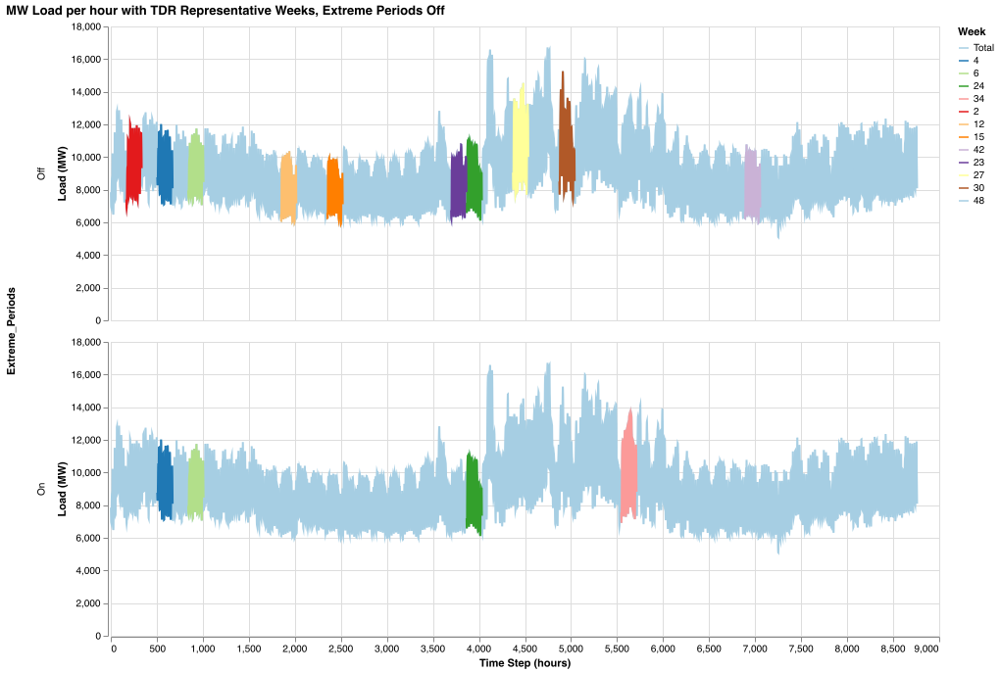

In [42]:
[loads_with_TDR; loads_with_TDR2] |>
@vlplot(mark={:line}, row="Extreme_Periods:n",
    x={:hour,title="Time Step (hours)",labels="Week:n"}, y={:MW,title="Load (MW)"},
    color={"Week:n", scale={scheme="paired"},sort="decsending"}, 
    title="MW Load per hour with TDR Representative Weeks, Extreme Periods Off",
    width=845,height=300)

In [ ]:
recon[!,"Extreme_Periods"] = repeat(["On"],length(recon[!,1]));

In [ ]:
recon_noex = []
for i in range(1,52)
    index = Period_map2[i,"Rep_Period"]
    recon_noex_temp = [repeat([index],168) collect((168*i-167):168*i) loads[(168*index-167):168*index,"Demand_MW_z1"]]
    recon_noex = [recon_noex; recon_noex_temp]
end

recon_noex = [recon_noex repeat(["Off"],8736)];

recon_noex = DataFrame(recon_noex,["Week","hour", "MW", "Extreme_Periods"])
recon_noex[!,:hour] = convert.(Int64,recon_noex[!,:hour]);
recon_noex[!,:MW] = convert.(Float64,recon_noex[!,:MW]);

[recon_noex; recon]  |>
@vlplot(mark={:line}, row="Extreme_Periods:n",
    x={:hour,title="Time Step (hours)",labels="Week:n"}, y={:MW,title="Load (MW)"},
    color={"Week:n", scale={scheme="paired"},sort="decsending"},title="MW Load per hour Reconstructed",
    width=845,height=400)

Turn Extreme Periods back on:

In [44]:
time_domain_reduction_settings["ExtremePeriods"] = 1;
YAML.write_file(joinpath(case,"settings/time_domain_reduction_settings.yml"), time_domain_reduction_settings);
rm(joinpath(case,"TDR_results"), recursive=true) 

### Objective Values and Representative Periods <a id="ObjVals"></a>

Each time `Run.jl` is run, a `Results` folder is produced. This folder contains numerous .csv files with output variable from the GenX model. For more information on all outputs, see the documentation <a href="https://genxproject.github.io/GenX/dev/data_documentation/#Outputs" target="_blank">here</a>.

This section focuses on the __objective value__ of the model. In optimization problems, the objective value is the main value minimized or maximized within the constraints of the model, according to the __objective function__ specified in the problem formulation. In the case of GenX, the objective function is the total annual electricity system cost. A detailed description of the optimization problem is  <a href="https://genxproject.github.io/GenX/dev/objective_function/" target="_blank">here</a> in the documentation. 

For the purpose of this tutorial, we focus on the objective value as a way to evaluate how well the representative periods actually "represent" the entire model. To see how well the objective value of representative periods aligns with that of the total period, we can run `example_systems/1_three_zone` with a variety of minimum and maximum total periods.

As a reminder, here are the time domain reduction settings we've been using:

In [17]:
time_domain_reduction_settings

Dict{Any, Any} with 15 entries:
  "IterativelyAddPeriods" => 1
  "ExtremePeriods"        => 1
  "UseExtremePeriods"     => 1
  "MinPeriods"            => 8
  "MaxPeriods"            => 8
  "DemandWeight"          => 1
  "ClusterFuelPrices"     => 1
  "nReps"                 => 100
  "MultiStageConcatenate" => 0
  "Threshold"             => 0.05
  "TimestepsPerRepPeriod" => 168
  "IterateMethod"         => "cluster"
  "ScalingMethod"         => "S"
  "ClusterMethod"         => "kmeans"
  "WeightTotal"           => 8760

Each time Run.jl is run, a new results folder appears in the model folder. These folders are not overwritten. So far, we've run the model twice, so we should have two results folders, Results and Results_1 in the OneZone folder, but you may have more if you've run the model more than twice. To ensure that the following code works, we'll delete any Results folders beyond the original.

In [18]:
folders = cd(readdir,case)
     

18-element Vector{String}:
 ".DS_Store"
 "CO2_cap.csv"
 "Demand_data.csv"
 "Fuels_data.csv"
 "Generators_variability.csv"
 "Minimum_capacity_requirement.csv"
 "Network.csv"
 "README.md"
 "Resource_minimum_capacity_requirement.csv"
 "Results"
 "Run.jl"
 "Storage.csv"
 "Thermal.csv"
 "Vre.csv"
 "policies"
 "resources"
 "settings"
 "system"

In [52]:
for folder in folders
    if length(folder) >= 8 && folder[1:8] == "Results_"
        rm("Example_Systems_Tutorials/SmallNewEngland/OneZone/" * folder,recursive=true) 
    end
end
     
cd(readdir,case) ## Make sure they were deleted

18-element Vector{String}:
 ".DS_Store"
 "CO2_cap.csv"
 "Demand_data.csv"
 "Fuels_data.csv"
 "Generators_variability.csv"
 "Minimum_capacity_requirement.csv"
 "Network.csv"
 "README.md"
 "Resource_minimum_capacity_requirement.csv"
 "Results"
 "Run.jl"
 "Storage.csv"
 "Thermal.csv"
 "Vre.csv"
 "policies"
 "resources"
 "settings"
 "system"

To demonstrate how the objective value changes as the number of representative periods does, we'll run GenX ten times, each with a different number of periods, and plot the objective values.

In [19]:
# Change MinPeriods and Max Periods, run `Run.jl`
# For simplicity, keep min and max periods the same
rep_periods = [4, 8, 12, 24, 36, 48]
times = [0.0,0.0,0.0,0.0,0.0,0.0]

for i in range(1,6)
    println(" ")
    println("----------------------------------------------------")
    println("Iteration ",i)
    println("Periods = ",rep_periods[i])
    println("----------------------------------------------------")
    time_domain_reduction_settings["MinPeriods"] = rep_periods[i]
    time_domain_reduction_settings["MaxPeriods"] = rep_periods[i]
    if "TDR_Results" in cd(readdir,case)
        rm(joinpath(case,"TDR_results"), recursive=true) 
    end
    println(" ")
    YAML.write_file(joinpath(case,"settings/time_domain_reduction_settings.yml"), time_domain_reduction_settings)
    time = @elapsed include("example_systems/1_three_zones/Run.jl")
    times[i] = time
    println(" ")
    println("Total Elapsed Time: ", time, "seconds")
    println(" ")
end

    

 
----------------------------------------------------
Iteration 1
Periods = 4
----------------------------------------------------
 
Configuring Settings
Clustering Time Series Data (Grouped)...
Reading Input CSV Files
Network.csv Successfully Read!
Demand (load) data Successfully Read!
Fuels_data.csv Successfully Read!

Summary of resources loaded into the model:
-------------------------------------------------------
	Resource type 		Number of resources
	Thermal        		3
	VRE            		4
	Storage        		3
Total number of resources: 10
-------------------------------------------------------
Generators_variability.csv Successfully Read!
Validating time basis
CO2_cap.csv Successfully Read!
CSV Files Successfully Read In From /Users/mayamutic/Desktop/GenX-Tutorials/Tutorials/example_systems/1_three_zones


[ Info: Thermal.csv Successfully Read.
[ Info: Vre.csv Successfully Read.
[ Info: Storage.csv Successfully Read.


Error: Geography Key 1 is invalid. Select `System' or `Zone'.
Configuring Solver
Loading Inputs
Reading Input CSV Files
Network.csv Successfully Read!
Demand (load) data Successfully Read!
Fuels_data.csv Successfully Read!

Summary of resources loaded into the model:
-------------------------------------------------------
	Resource type 		Number of resources
	Thermal        		3
	VRE            		4
	Storage        		3
Total number of resources: 10
-------------------------------------------------------
Generators_variability.csv Successfully Read!
Validating time basis
CO2_cap.csv Successfully Read!
CSV Files Successfully Read In From /Users/mayamutic/Desktop/GenX-Tutorials/Tutorials/example_systems/1_three_zones
Generating the Optimization Model
Set parameter Username
Academic license - for non-commercial use only - expires 2024-09-14
Set parameter FeasibilityTol to value 1e-05
Set parameter PreDual to value 0
Set parameter Method to value 4
Set parameter TimeLimit to value 110000
Set 

[ Info: Thermal.csv Successfully Read.
[ Info: Vre.csv Successfully Read.
[ Info: Storage.csv Successfully Read.


CO2 Module
Transmission Module
Dispatchable Resources Module
Storage Resources Module
Storage Investment Module
Storage Core Resources Module
Storage Resources with Symmetric Charge/Discharge Capacity Module
Thermal (Unit Commitment) Resources Module
CO2 Policies Module
Time elapsed for model building is
0.263119917
Solving Model
Set parameter FeasibilityTol to value 1e-05
Set parameter PreDual to value 0
Set parameter Method to value 4
Set parameter TimeLimit to value 110000
Set parameter MIPGap to value 0.001
Set parameter OptimalityTol to value 1e-05
Set parameter AggFill to value 10
Set parameter Presolve to value 1
Gurobi Optimizer version 10.0.3 build v10.0.3rc0 (mac64[arm])

CPU model: Apple M2
Thread count: 8 physical cores, 8 logical processors, using up to 8 threads

Optimize a model with 55787 rows, 43699 columns and 187463 nonzeros
Model fingerprint: 0x61ab5470
Coefficient statistics:
  Matrix range     [3e-06, 1e+01]
  Objective range  [5e-04, 1e+03]
  Bounds range     [0e

Time elapsed for writing net revenue is
0.121884208
Wrote outputs to /Users/mayamutic/Desktop/GenX-Tutorials/Tutorials/example_systems/1_three_zones/Results_1
Time elapsed for writing is
0.500091625
 
----------------------------------------------------
Iteration 2
Periods = 8
----------------------------------------------------
 
Configuring Settings
Clustering Time Series Data (Grouped)...
Reading Input CSV Files
Network.csv Successfully Read!
Demand (load) data Successfully Read!
Fuels_data.csv Successfully Read!

Summary of resources loaded into the model:
-------------------------------------------------------
	Resource type 		Number of resources
	Thermal        		3
	VRE            		4
	Storage        		3
Total number of resources: 10
-------------------------------------------------------
Generators_variability.csv Successfully Read!
Validating time basis
CO2_cap.csv Successfully Read!
CSV Files Successfully Read In From /Users/mayamutic/Desktop/GenX-Tutorials/Tutorials/example_s

[ Info: Thermal.csv Successfully Read.
[ Info: Vre.csv Successfully Read.
[ Info: Storage.csv Successfully Read.


Configuring Solver
Loading Inputs
Reading Input CSV Files
Network.csv Successfully Read!
Demand (load) data Successfully Read!
Fuels_data.csv Successfully Read!

Summary of resources loaded into the model:
-------------------------------------------------------
	Resource type 		Number of resources
	Thermal        		3
	VRE            		4
	Storage        		3
Total number of resources: 10
-------------------------------------------------------
Generators_variability.csv Successfully Read!
Validating time basis
CO2_cap.csv Successfully Read!
CSV Files Successfully Read In From /Users/mayamutic/Desktop/GenX-Tutorials/Tutorials/example_systems/1_three_zones
Generating the Optimization Model
Set parameter Username
Academic license - for non-commercial use only - expires 2024-09-14
Set parameter FeasibilityTol to value 1e-05
Set parameter PreDual to value 0
Set parameter Method to value 4
Set parameter TimeLimit to value 110000
Set parameter MIPGap to value 0.001
Set parameter OptimalityTol to

[ Info: Thermal.csv Successfully Read.
[ Info: Vre.csv Successfully Read.
[ Info: Storage.csv Successfully Read.


Investment Discharge Module
Unit Commitment Module
Fuel Module
CO2 Module
Transmission Module
Dispatchable Resources Module
Storage Resources Module
Storage Investment Module
Storage Core Resources Module
Storage Resources with Symmetric Charge/Discharge Capacity Module
Thermal (Unit Commitment) Resources Module
CO2 Policies Module
Time elapsed for model building is
0.543595042
Solving Model
Set parameter FeasibilityTol to value 1e-05
Set parameter PreDual to value 0
Set parameter Method to value 4
Set parameter TimeLimit to value 110000
Set parameter MIPGap to value 0.001
Set parameter OptimalityTol to value 1e-05
Set parameter AggFill to value 10
Set parameter Presolve to value 1
Gurobi Optimizer version 10.0.3 build v10.0.3rc0 (mac64[arm])

CPU model: Apple M2
Thread count: 8 physical cores, 8 logical processors, using up to 8 threads

Optimize a model with 111563 rows, 87379 columns and 374925 nonzeros
Model fingerprint: 0x2002dca7
Coefficient statistics:
  Matrix range     [4e-07,

Time elapsed for writing emissions is
0.024866667
Time elapsed for writing reliability is
0.008462834
Time elapsed for writing storage duals is
0.012805417
Time elapsed for writing commitment is
0.007833458
Time elapsed for writing startup is
0.015604333
Time elapsed for writing shutdown is
0.015067209
Time elapsed for writing fuel consumption is
0.056188334
Time elapsed for writing co2 is
0.025061542
Time elapsed for writing price is
0.007397333
Time elapsed for writing energy revenue is
0.015875459
Time elapsed for writing charging cost is
0.007318333
Time elapsed for writing subsidy is
0.000325416
Time elapsed for writing time weights is
0.000571166
Time elapsed for writing co2 cap is
0.00013725
Time elapsed for writing net revenue is
0.024916542
Wrote outputs to /Users/mayamutic/Desktop/GenX-Tutorials/Tutorials/example_systems/1_three_zones/Results_2
Time elapsed for writing is
0.697264875
 
----------------------------------------------------
Iteration 3
Periods = 12
-------------

[ Info: Thermal.csv Successfully Read.
[ Info: Vre.csv Successfully Read.
[ Info: Storage.csv Successfully Read.


Configuring Solver
Loading Inputs
Reading Input CSV Files
Network.csv Successfully Read!
Demand (load) data Successfully Read!
Fuels_data.csv Successfully Read!

Summary of resources loaded into the model:
-------------------------------------------------------
	Resource type 		Number of resources
	Thermal        		3
	VRE            		4
	Storage        		3
Total number of resources: 10
-------------------------------------------------------
Generators_variability.csv Successfully Read!
Validating time basis
CO2_cap.csv Successfully Read!
CSV Files Successfully Read In From /Users/mayamutic/Desktop/GenX-Tutorials/Tutorials/example_systems/1_three_zones
Generating the Optimization Model
Set parameter Username
Academic license - for non-commercial use only - expires 2024-09-14
Set parameter FeasibilityTol to value 1e-05
Set parameter PreDual to value 0
Set parameter Method to value 4
Set parameter TimeLimit to value 110000
Set parameter MIPGap to value 0.001
Set parameter OptimalityTol to

[ Info: Thermal.csv Successfully Read.
[ Info: Vre.csv Successfully Read.
[ Info: Storage.csv Successfully Read.


Non-served Energy Module
Investment Discharge Module
Unit Commitment Module
Fuel Module
CO2 Module
Transmission Module
Dispatchable Resources Module
Storage Resources Module
Storage Investment Module
Storage Core Resources Module
Storage Resources with Symmetric Charge/Discharge Capacity Module
Thermal (Unit Commitment) Resources Module
CO2 Policies Module
Time elapsed for model building is
0.846390875
Solving Model
Set parameter FeasibilityTol to value 1e-05
Set parameter PreDual to value 0
Set parameter Method to value 4
Set parameter TimeLimit to value 110000
Set parameter MIPGap to value 0.001
Set parameter OptimalityTol to value 1e-05
Set parameter AggFill to value 10
Set parameter Presolve to value 1
Gurobi Optimizer version 10.0.3 build v10.0.3rc0 (mac64[arm])

CPU model: Apple M2
Thread count: 8 physical cores, 8 logical processors, using up to 8 threads

Optimize a model with 167339 rows, 131059 columns and 562270 nonzeros
Model fingerprint: 0xf2882794
Coefficient statistics:


Time elapsed for writing curtailment is
0.036652167
Time elapsed for writing nse is
0.091031458
Time elapsed for writing power balance is
0.08626625
Time elapsed for writing transmission flows is
0.030493625
Time elapsed for writing transmission losses is
0.027682708
Time elapsed for writing network expansion is
0.000385709
Time elapsed for writing emissions is
0.041670083
Time elapsed for writing reliability is
0.0150985
Time elapsed for writing storage duals is
0.01879425
Time elapsed for writing commitment is
0.012582292
Time elapsed for writing startup is
0.029756958
Time elapsed for writing shutdown is
0.030288875
Time elapsed for writing fuel consumption is
0.098096708
Time elapsed for writing co2 is
0.035101167
Time elapsed for writing price is
0.01330125
Time elapsed for writing energy revenue is
0.147045791
Time elapsed for writing charging cost is
0.01288275
Time elapsed for writing subsidy is
0.000435708
Time elapsed for writing time weights is
0.000889792
Time elapsed for w

[ Info: Thermal.csv Successfully Read.
[ Info: Vre.csv Successfully Read.
[ Info: Storage.csv Successfully Read.


Configuring Solver
Loading Inputs
Reading Input CSV Files
Network.csv Successfully Read!
Demand (load) data Successfully Read!
Fuels_data.csv Successfully Read!

Summary of resources loaded into the model:
-------------------------------------------------------
	Resource type 		Number of resources
	Thermal        		3
	VRE            		4
	Storage        		3
Total number of resources: 10
-------------------------------------------------------
Generators_variability.csv Successfully Read!
Validating time basis
CO2_cap.csv Successfully Read!
CSV Files Successfully Read In From /Users/mayamutic/Desktop/GenX-Tutorials/Tutorials/example_systems/1_three_zones
Generating the Optimization Model
Set parameter Username
Academic license - for non-commercial use only - expires 2024-09-14
Set parameter FeasibilityTol to value 1e-05
Set parameter PreDual to value 0
Set parameter Method to value 4
Set parameter TimeLimit to value 110000
Set parameter MIPGap to value 0.001
Set parameter OptimalityTol to

[ Info: Thermal.csv Successfully Read.
[ Info: Vre.csv Successfully Read.
[ Info: Storage.csv Successfully Read.


Non-served Energy Module
Investment Discharge Module
Unit Commitment Module
Fuel Module
CO2 Module
Transmission Module
Dispatchable Resources Module
Storage Resources Module
Storage Investment Module
Storage Core Resources Module
Storage Resources with Symmetric Charge/Discharge Capacity Module
Thermal (Unit Commitment) Resources Module
CO2 Policies Module
Time elapsed for model building is
1.66864425
Solving Model
Set parameter FeasibilityTol to value 1e-05
Set parameter PreDual to value 0
Set parameter Method to value 4
Set parameter TimeLimit to value 110000
Set parameter MIPGap to value 0.001
Set parameter OptimalityTol to value 1e-05
Set parameter AggFill to value 10
Set parameter Presolve to value 1
Gurobi Optimizer version 10.0.3 build v10.0.3rc0 (mac64[arm])

CPU model: Apple M2
Thread count: 8 physical cores, 8 logical processors, using up to 8 threads

Optimize a model with 334667 rows, 262099 columns and 1124609 nonzeros
Model fingerprint: 0x6831333c
Coefficient statistics:


Time elapsed for writing costs is
0.250499875
Time elapsed for writing capacity is
0.000648667
Time elapsed for writing power is
0.185954792
Time elapsed for writing charge is
0.045489208
Time elapsed for writing capacity factor is
0.027638
Time elapsed for writing storage is
0.024300958
Time elapsed for writing curtailment is
0.056107875
Time elapsed for writing nse is
0.145590875
Time elapsed for writing power balance is
0.152262791
Time elapsed for writing transmission flows is
0.042833791
Time elapsed for writing transmission losses is
0.050996
Time elapsed for writing network expansion is
0.000342333
Time elapsed for writing emissions is
0.084810167
Time elapsed for writing reliability is
0.026639125
Time elapsed for writing storage duals is
0.036899125
Time elapsed for writing commitment is
0.024486917
Time elapsed for writing startup is
0.154759166
Time elapsed for writing shutdown is
0.044108708
Time elapsed for writing fuel consumption is
0.151387667
Time elapsed for writing c

[ Info: Thermal.csv Successfully Read.
[ Info: Vre.csv Successfully Read.
[ Info: Storage.csv Successfully Read.


Configuring Solver
Loading Inputs
Reading Input CSV Files
Network.csv Successfully Read!
Demand (load) data Successfully Read!
Fuels_data.csv Successfully Read!

Summary of resources loaded into the model:
-------------------------------------------------------
	Resource type 		Number of resources
	Thermal        		3
	VRE            		4
	Storage        		3
Total number of resources: 10
-------------------------------------------------------
Generators_variability.csv Successfully Read!
Validating time basis
CO2_cap.csv Successfully Read!
CSV Files Successfully Read In From /Users/mayamutic/Desktop/GenX-Tutorials/Tutorials/example_systems/1_three_zones
Generating the Optimization Model
Set parameter Username
Academic license - for non-commercial use only - expires 2024-09-14
Set parameter FeasibilityTol to value 1e-05
Set parameter PreDual to value 0
Set parameter Method to value 4
Set parameter TimeLimit to value 110000
Set parameter MIPGap to value 0.001
Set parameter OptimalityTol to

[ Info: Thermal.csv Successfully Read.
[ Info: Vre.csv Successfully Read.
[ Info: Storage.csv Successfully Read.


Non-served Energy Module
Investment Discharge Module
Unit Commitment Module
Fuel Module
CO2 Module
Transmission Module
Dispatchable Resources Module
Storage Resources Module
Storage Investment Module
Storage Core Resources Module
Storage Resources with Symmetric Charge/Discharge Capacity Module
Thermal (Unit Commitment) Resources Module
CO2 Policies Module
Time elapsed for model building is
2.633583125
Solving Model
Set parameter FeasibilityTol to value 1e-05
Set parameter PreDual to value 0
Set parameter Method to value 4
Set parameter TimeLimit to value 110000
Set parameter MIPGap to value 0.001
Set parameter OptimalityTol to value 1e-05
Set parameter AggFill to value 10
Set parameter Presolve to value 1
Gurobi Optimizer version 10.0.3 build v10.0.3rc0 (mac64[arm])

CPU model: Apple M2
Thread count: 8 physical cores, 8 logical processors, using up to 8 threads

Optimize a model with 501995 rows, 393139 columns and 1686909 nonzeros
Model fingerprint: 0x3c725ace
Coefficient statistics:

Time elapsed for writing costs is
0.466652833
Time elapsed for writing capacity is
0.001428709
Time elapsed for writing power is
0.102175875
Time elapsed for writing charge is
0.282882125
Time elapsed for writing capacity factor is
0.053201417
Time elapsed for writing storage is
0.043742709
Time elapsed for writing curtailment is
0.103783084
Time elapsed for writing nse is
0.254380417
Time elapsed for writing power balance is
0.262823666
Time elapsed for writing transmission flows is
0.071056208
Time elapsed for writing transmission losses is
0.2070375
Time elapsed for writing network expansion is
0.000497
Time elapsed for writing emissions is
0.106264666
Time elapsed for writing reliability is
0.032337417
Time elapsed for writing storage duals is
0.043180542
Time elapsed for writing commitment is
0.029970625
Time elapsed for writing startup is
0.060808542
Time elapsed for writing shutdown is
0.057529834
Time elapsed for writing fuel consumption is
0.221870083
Time elapsed for writing 

[ Info: Thermal.csv Successfully Read.
[ Info: Vre.csv Successfully Read.
[ Info: Storage.csv Successfully Read.


Configuring Solver
Loading Inputs
Reading Input CSV Files
Network.csv Successfully Read!
Demand (load) data Successfully Read!
Fuels_data.csv Successfully Read!

Summary of resources loaded into the model:
-------------------------------------------------------
	Resource type 		Number of resources
	Thermal        		3
	VRE            		4
	Storage        		3
Total number of resources: 10
-------------------------------------------------------
Generators_variability.csv Successfully Read!
Validating time basis
CO2_cap.csv Successfully Read!
CSV Files Successfully Read In From /Users/mayamutic/Desktop/GenX-Tutorials/Tutorials/example_systems/1_three_zones
Generating the Optimization Model
Set parameter Username
Academic license - for non-commercial use only - expires 2024-09-14
Set parameter FeasibilityTol to value 1e-05
Set parameter PreDual to value 0
Set parameter Method to value 4
Set parameter TimeLimit to value 110000
Set parameter MIPGap to value 0.001
Set parameter OptimalityTol to

[ Info: Thermal.csv Successfully Read.
[ Info: Vre.csv Successfully Read.
[ Info: Storage.csv Successfully Read.


Non-served Energy Module
Investment Discharge Module
Unit Commitment Module
Fuel Module
CO2 Module
Transmission Module
Dispatchable Resources Module
Storage Resources Module
Storage Investment Module
Storage Core Resources Module
Storage Resources with Symmetric Charge/Discharge Capacity Module
Thermal (Unit Commitment) Resources Module
CO2 Policies Module
Time elapsed for model building is
3.386500083
Solving Model
Set parameter FeasibilityTol to value 1e-05
Set parameter PreDual to value 0
Set parameter Method to value 4
Set parameter TimeLimit to value 110000
Set parameter MIPGap to value 0.001
Set parameter OptimalityTol to value 1e-05
Set parameter AggFill to value 10
Set parameter Presolve to value 1
Gurobi Optimizer version 10.0.3 build v10.0.3rc0 (mac64[arm])

CPU model: Apple M2
Thread count: 8 physical cores, 8 logical processors, using up to 8 threads

Optimize a model with 669323 rows, 524179 columns and 2249345 nonzeros
Model fingerprint: 0x30af72b6
Coefficient statistics:

Writing Output
Time elapsed for writing costs is
3.167977125
Time elapsed for writing capacity is
0.046735208
Time elapsed for writing power is
0.204002708
Time elapsed for writing charge is
0.128137875
Time elapsed for writing capacity factor is
0.071913125
Time elapsed for writing storage is
0.242555208
Time elapsed for writing curtailment is
0.152296334
Time elapsed for writing nse is
0.400016125
Time elapsed for writing power balance is
0.387756958
Time elapsed for writing transmission flows is
0.241086375
Time elapsed for writing transmission losses is
0.099873792
Time elapsed for writing network expansion is
0.001250458
Time elapsed for writing emissions is
0.150839041
Time elapsed for writing reliability is
0.065528875
Time elapsed for writing storage duals is
0.068836833
Time elapsed for writing commitment is
0.042635958
Time elapsed for writing startup is
0.088003875
Time elapsed for writing shutdown is
0.086884167
Time elapsed for writing fuel consumption is
0.39994425
Time e

Note that as the number of periods increases, so does the time it takes to run.

Now, let's check that we have the correct Results folders and process the objecive values to plot. There should be seven results folders, including the original `Results`.

The objective value is found in the files `costs.csv` and `status.csv`.

In [20]:
status = CSV.read(joinpath(case,"Results/status.csv"),DataFrame,missingstring="NA")

Row,Status,Solve,Objval
,String7,Float64,Float64
1,OPTIMAL,84.6809,9762.44


In [21]:
# Find objective values from each results folder:

OV_noTDR = CSV.read(joinpath(case,"Results/status.csv"),DataFrame);
OV_RP4 = CSV.read(joinpath(case,"Results_1/status.csv"),DataFrame);
OV_RP8 = CSV.read(joinpath(case,"Results_2/status.csv"),DataFrame);
OV_RP12 = CSV.read(joinpath(case,"Results_3/status.csv"),DataFrame);
OV_RP24 = CSV.read(joinpath(case,"Results_4/status.csv"),DataFrame);
OV_RP36 = CSV.read(joinpath(case,"Results_5/status.csv"),DataFrame);
OV_RP48 = CSV.read(joinpath(case,"Results_6/status.csv"),DataFrame);

In [23]:
# Isolate the objective values from the data frame
obj_val_tot = [1 OV_noTDR[!,3]; 
               4 OV_RP4[!,3];
               8 OV_RP8[!,3];
               12 OV_RP12[!,3]; 
               24 OV_RP24[!,3]; 
               36 OV_RP36[!,3]; 
               48 OV_RP48[!,3]];
DataFrame(obj_val_tot,["Rep_Periods","Obj_Val"])

Row,Rep_Periods,Obj_Val
,Float64,Float64
1,1.0,9762.44
2,4.0,8550.7
3,8.0,9420.53
4,12.0,10223.0
5,24.0,9641.49
6,36.0,9809.34
7,48.0,9732.26


In [58]:
# Take the absolute difference between the original objective value and the new ones
obj_val_plot = [4 abs(OV_noTDR[!,3][1]-OV_RP4[!,3][1]); 
                8 abs(OV_noTDR[!,3][1]-OV_RP8[!,3][1]); 
                12 abs(OV_noTDR[!,3][1]-OV_RP12[!,3][1]);
                24 abs(OV_noTDR[!,3][1]-OV_RP24[!,3][1]); 
                36 abs(OV_noTDR[!,3][1]-OV_RP36[!,3][1]); 
                48 abs(OV_noTDR[!,3][1]-OV_RP48[!,3][1])]
DataFrame(obj_val_plot,["Rep_Periods","Error"])

Row,Rep_Periods,Error
,Float64,Float64
1,4.0,1211.74
2,8.0,341.909
3,12.0,460.551
4,24.0,120.943
5,36.0,46.9011
6,48.0,30.1759


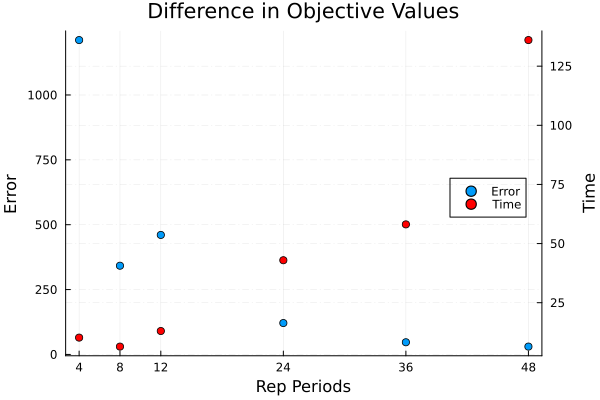

In [51]:
# Plot the differences as a function of number of representative periods
gr()
Plots.scatter(obj_val_plot[:,1],obj_val_plot[:,2],xticks=obj_val_plot[:,1],
                ylabel="Error",xlabel="Rep Periods",title="Difference in Objective Values",label=:"Error")
scatter!(obj_val_plot[:,1],NaN.*times,color=:red,legend=:right,label="Time") # For the legend
scatter!(twinx(),obj_val_plot[:,1],times,color=:red,legend=false,
    yaxis=(label="Time"),label="Time")
ygrid!(:on, :dashdot, 0.1)

Here, we can see that while having very few representative periods produces an objective value that differs greatly from the orignal, once we reach around 12 representative periods the difference begins to taper out. Therefore, the original choice of 11 maximum periods in `SmallNewEngland/OneZone` decreases the run time of GenX significantly while while maintaining an objective value close to the original.


It's important to note, however, that  the difference does not always taper out, and for some systems you'll find that the error in objective value continues to decrease as the number of representative periods increases. There also is no way to know apriori what number of periods works.

Finally, let's set TDR to have 8 and 11 min/max periods again, and delete the TDR Results folder.

In [52]:
time_domain_reduction_settings["MinPeriods"] = 8;
time_domain_reduction_settings["MaxPeriods"] = 11;

In [53]:
time_domain_reduction_settings

Dict{Any, Any} with 15 entries:
  "IterativelyAddPeriods" => 1
  "ExtremePeriods"        => 1
  "UseExtremePeriods"     => 1
  "MinPeriods"            => 8
  "MaxPeriods"            => 11
  "DemandWeight"          => 1
  "ClusterFuelPrices"     => 1
  "nReps"                 => 100
  "MultiStageConcatenate" => 0
  "Threshold"             => 0.05
  "TimestepsPerRepPeriod" => 168
  "IterateMethod"         => "cluster"
  "ScalingMethod"         => "S"
  "ClusterMethod"         => "kmeans"
  "WeightTotal"           => 8760

In [56]:
rm(joinpath(case,"TDR_results"), recursive=true) 

In [57]:
YAML.write_file(joinpath(case,"settings/time_domain_reduction_settings.yml"), time_domain_reduction_settings)